# Using Ring Deconvolution Microscopy (RDM)

This is a notebook which will walk you through basics of rdmpy.

Interested in some background on these methods? Check out the [paper](https://arxiv.org/abs/2206.08928).

The data we use in this notebook comes from the [UCLA Miniscope](http://miniscope.org/index.php/Main_Page).


## Setup

Here we import some necessary packages for the demo, including the star of the show: rdmpy

In [4]:
import rdmpy

# here are some basics we will need for the demo
import torch
import numpy as np
import matplotlib.pyplot as plt

from skimage import io
from skimage.transform import resize
from PIL import Image

# Fill this in according to your computer, we highly recommend using a GPU.
# We needed ~20GB of GPU memory to run at full resolution.
if torch.cuda.is_available():
    device = torch.device('cuda:1')
else:
    device = torch.device('cpu')
    
    
print('Using ' +str(device) + ' for computation')




Using cuda:1 for computation


# # Calibration

The first step in the RDM pipeline is to calibrate your microscope. This is very similar to measuring a point spread function for deconvolution. The only difference is now you take a single image of randomly-placed point sources. We visualize one such calibration image from the Miniscope in the cell below. 

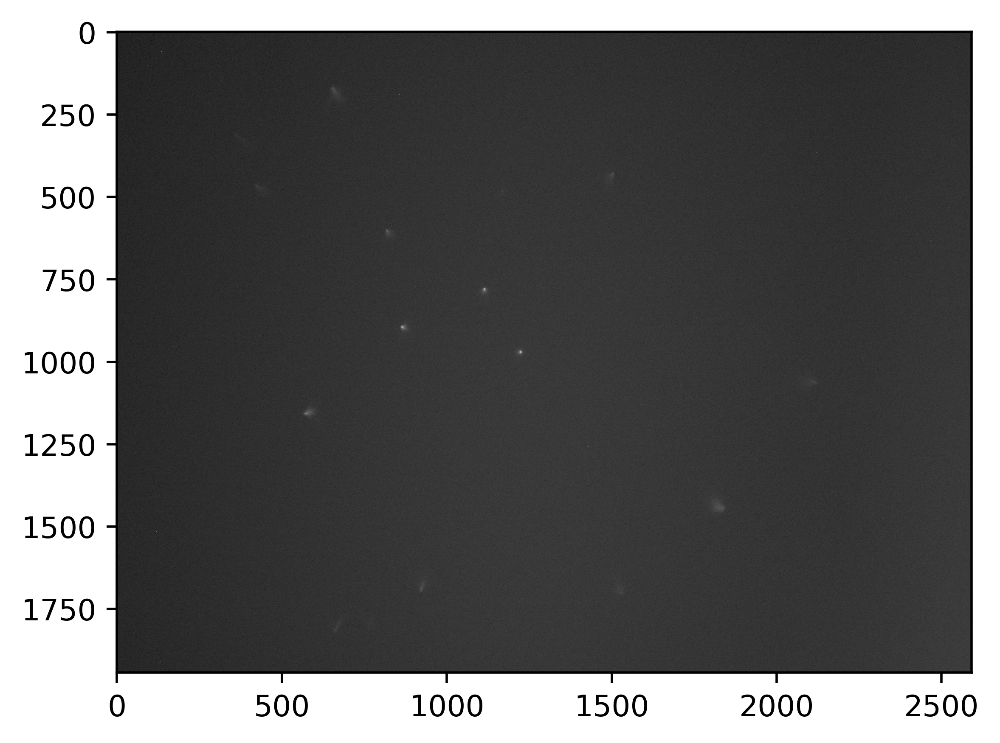

In [5]:
calibration_image = np.array(Image.open('test_images/calibration_image.tif'))
plt.imshow((calibration_image)**(1/2), cmap='gray')
plt.show()

To calibrate, just input this image into the `calibrate` function. This will give back Seidel coefficients and synthetic PSFs. These characterize the system and can be directly used to deblur any image taken from the microscope.

fitting seidel coefficients...


100%|██████████| 300/300 [00:16<00:00, 18.30it/s]


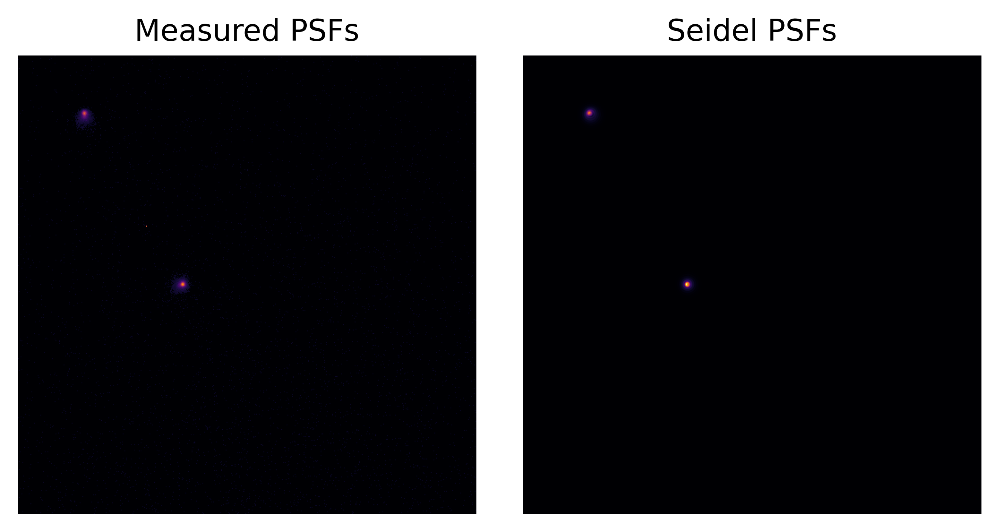

  0%|          | 1/512 [00:00<01:11,  7.12it/s]

Fitted seidel coefficients: tensor([[-0.7936],
        [ 0.3174],
        [-0.0123],
        [-0.2696],
        [ 0.0000],
        [ 0.0000]])
rendering PSFs...


100%|██████████| 512/512 [00:42<00:00, 11.92it/s]


In [6]:
dim = 512 # Pick this according to how big of an image you want to deblur.
seidel_coeffs, psf_data = rdmpy.calibrate(calibration_image, dim=dim, device=device, show_psfs=True)

# Deblurring

Having completed calibration, it's time to try out the various deblurring algorithms! We will start with ring deconvolution and DeepRD, and then try out some of the alternative methods. We will be deblurring an image of a tardigrade (shown below) taken with the Miniscope.  

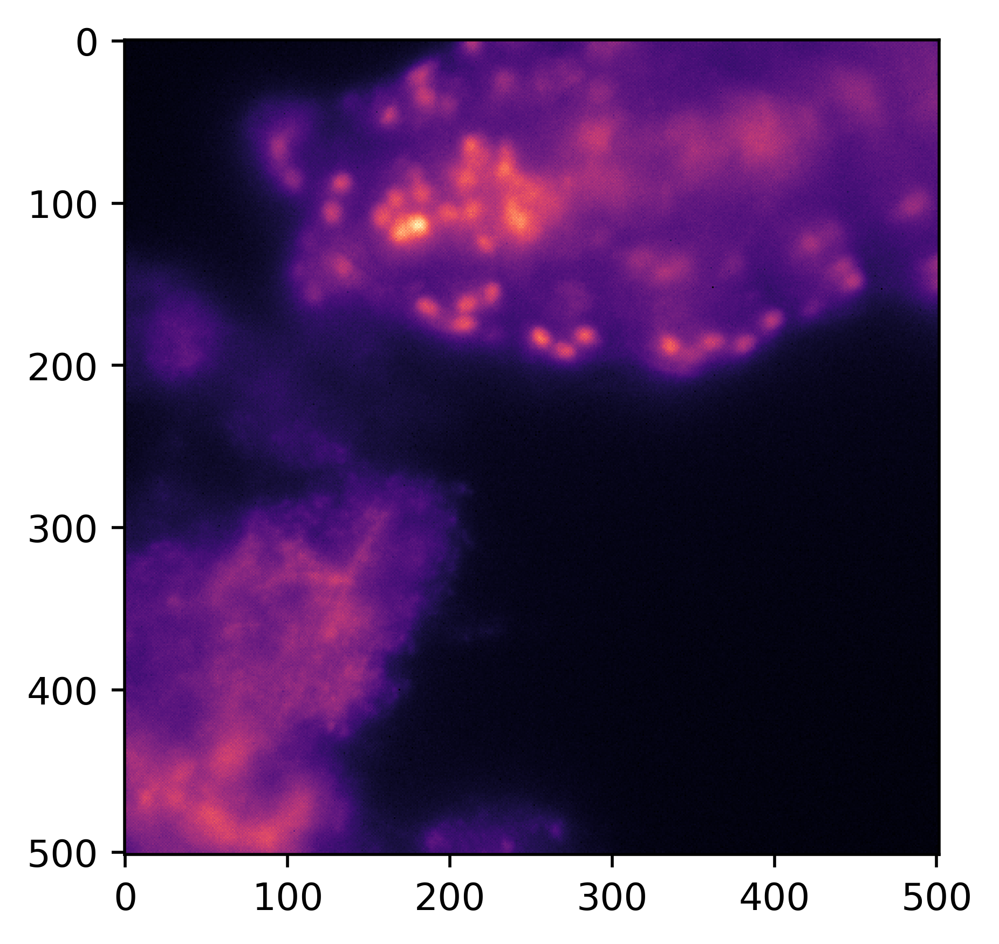

In [7]:
# A quick helper function to crop our image down to the correct size
def center_crop(img, des_shape, m_center=None):
    if m_center is None:
        m_center = (img.shape[0] // 2, img.shape[1] // 2)
    left, right, up, down = (
        m_center[1] - des_shape[1] // 2,
        m_center[1] + int(np.round(des_shape[1] / 2)),
        m_center[0] - des_shape[0] // 2,
        m_center[0] + int(np.round(des_shape[0] / 2)),
    )
    img = img[up:down, left:right]
    return img

# Add a small crop to help with edge artifacts
crop = 5

# read in the waterbear
measurement = center_crop(io.imread('test_images/measurement.png')[:,:,0], [dim,dim])
plt.imshow(measurement[crop:-crop, crop:-crop], cmap='magma')
plt.show()

Now, the moment we've been waiting for, it's time to use ring deconvolution! Just input the blurry image and psf data from calibration into `ring_deconvolve`.

100%|██████████| 300/300 [01:15<00:00,  3.96it/s]


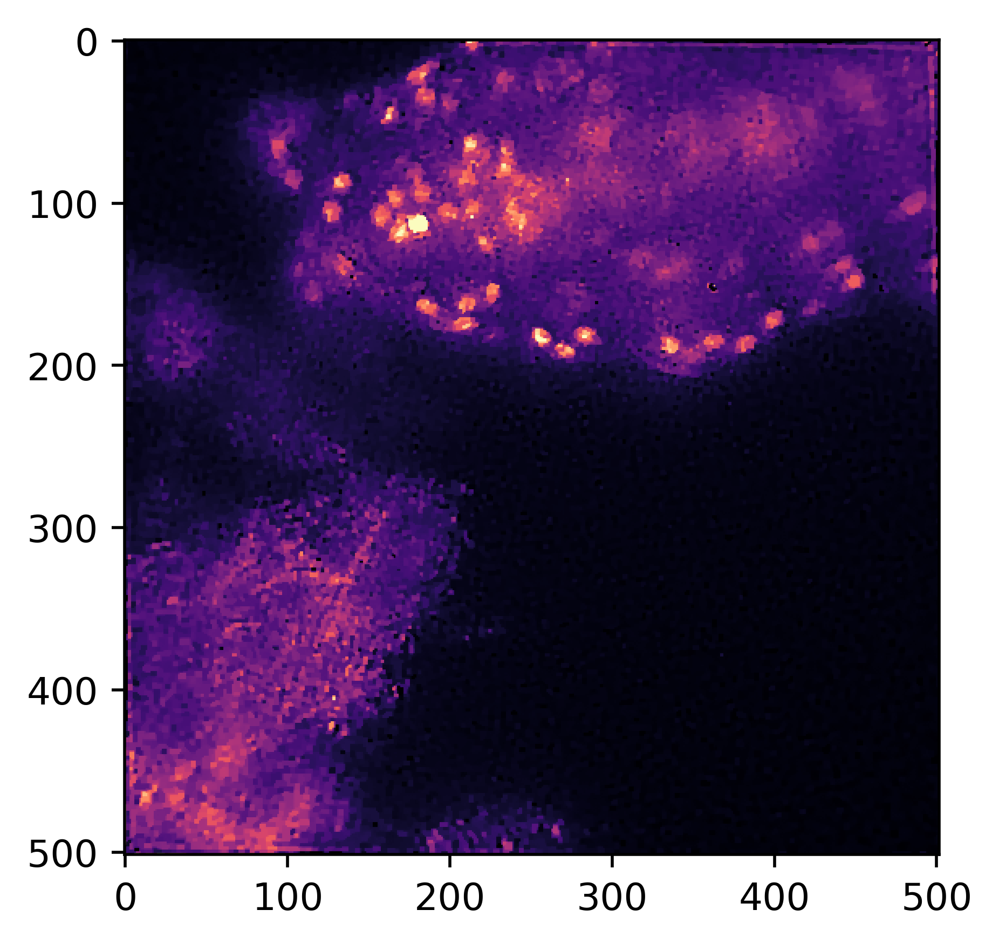

In [8]:
rd_recon = rdmpy.ring_deconvolve(measurement, psf_data, device=device)
plt.imshow(rd_recon[crop:-crop, crop:-crop], cmap='magma')
plt.show()

For a faster version, consider using `deeprd`. DeepRD only requires seidel coefficients, which can be gotted more efficiently by running calibrate with the `get_psf_data` flag set to false. But we've already gotten the coefficients, we we'll just use them directly.

loading model...
Using pretrained model "deeprd_512"


100%|██████████| 1/1 [00:00<00:00, 30.45it/s]

rendering PSFs...
deblurring...


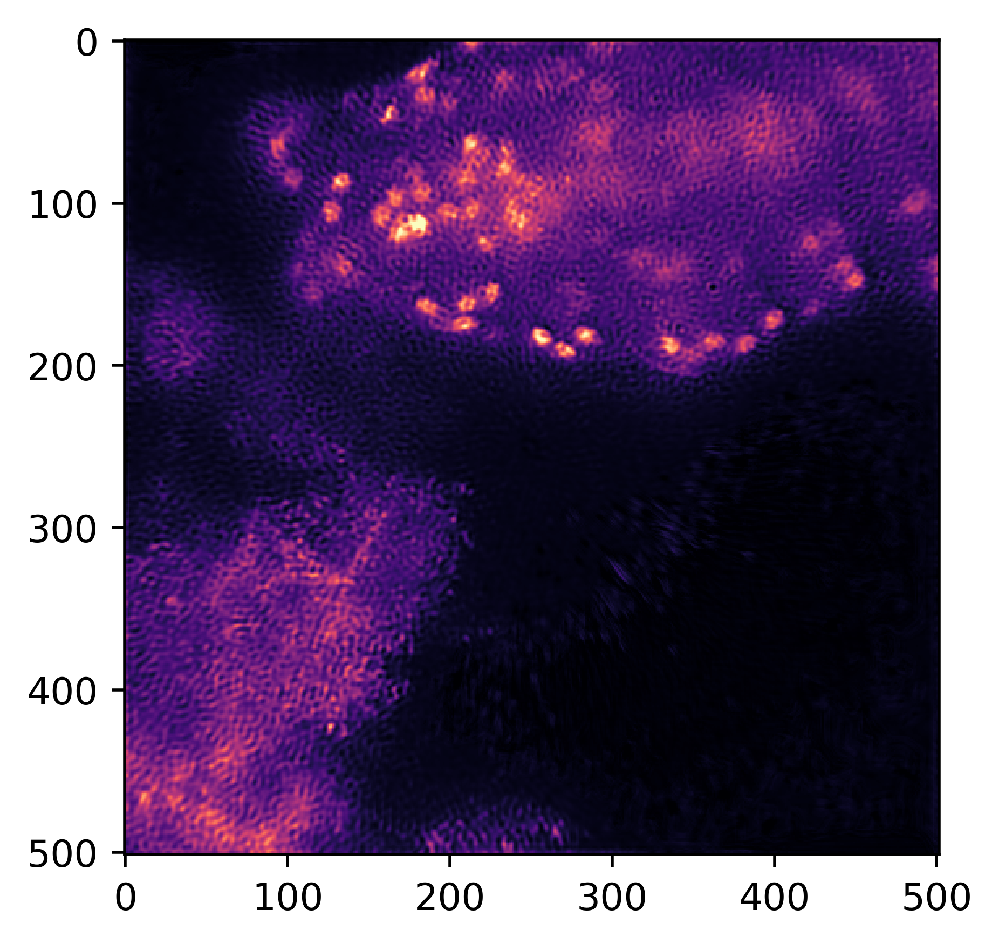

In [10]:
deeprd_recon = rdmpy.deeprd(measurement, seidel_coeffs, device=device)
plt.imshow(deeprd_recon[crop:-crop,crop:-crop], cmap='magma')
plt.show()

## Alternative methods

Suppose that that system is actually space-invariant; i.e., the PSF does not chance much across the field-of-view. In such a case is more sensible to use Seidel deconvoution, which we show below.

100%|██████████| 1/1 [00:00<00:00, 21.60it/s]

rendering PSFs...


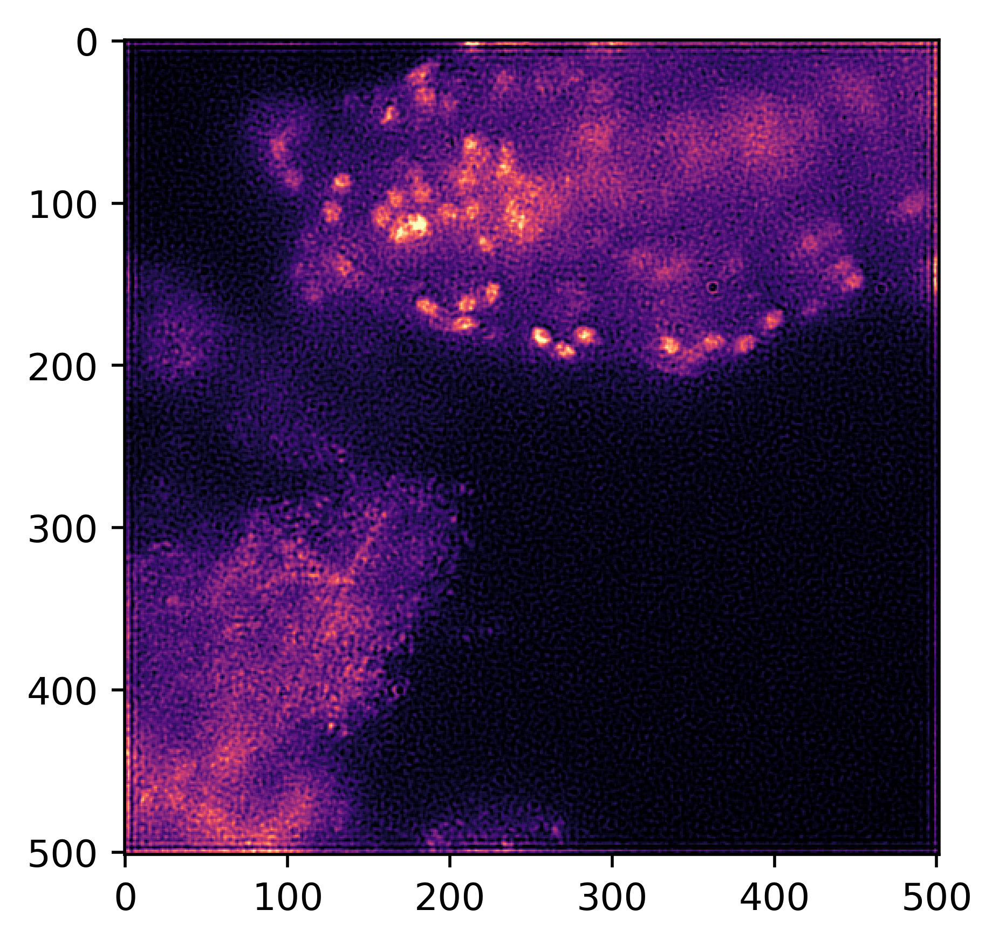

In [11]:
# First we calibrate (we already have seidel coefficients from before, so we can just directly get the PSF)
center_psf = rdmpy.get_psfs(seidel_coeffs, measurement.shape[0], model='lsi', device=device)

# Now we run standard deconvolution
deconv_recon = rdmpy.deconvolve(measurement, center_psf, method='wiener', device=device)

plt.imshow(deconv_recon[crop:-crop, crop:-crop], cmap='magma')
plt.show()

Finally, suppose that calibration data (e.g., the PSF) is not available. The only option is blind Seidel deconvolution, which we show below. Note that the only thing needed for blind deconvolution is the measurement!

100%|██████████| 100/100 [00:06<00:00, 14.63it/s]


Fitted seidel coefficient: tensor([0.8540])


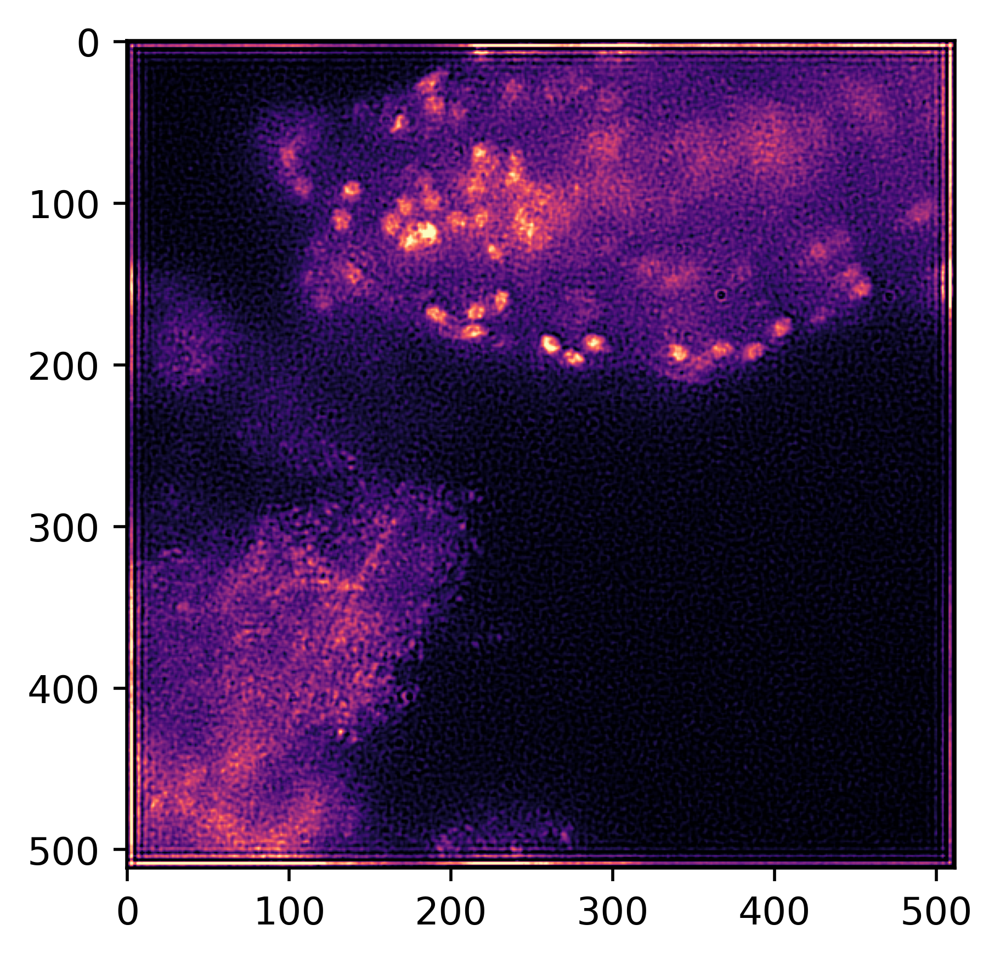

In [12]:
blind_recon = rdmpy.blind(measurement, device=device)

plt.imshow(blind_recon, cmap='magma')
plt.show()